In [1]:
import pandas as pd 
import os
# os.environ['TPU_LOG_DIR'] = '/kaggle/working'

import pandas as pd
pd.options.mode.chained_assignment = None # avoids assignment warning
import numpy as np
import random
from glob import glob
from tqdm import tqdm
tqdm.pandas()  # enable progress bars in pandas operations
import gc
import matplotlib.pyplot as plt
cmap = plt.get_cmap('coolwarm')
import librosa
import sklearn
import json

# Import for visualization

import matplotlib.pyplot as plt
import librosa.display as lid
import IPython.display as ipd

df = pd.read_csv('./train_metadata.csv')
df

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,asbfly,[],['call'],39.2297,118.1987,Muscicapa dauurica,Asian Brown Flycatcher,Matt Slaymaker,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/134896,asbfly/XC134896.ogg
1,asbfly,[],['song'],51.4030,104.6401,Muscicapa dauurica,Asian Brown Flycatcher,Magnus Hellström,Creative Commons Attribution-NonCommercial-Sha...,2.5,https://www.xeno-canto.org/164848,asbfly/XC164848.ogg
2,asbfly,[],['song'],36.3319,127.3555,Muscicapa dauurica,Asian Brown Flycatcher,Stuart Fisher,Creative Commons Attribution-NonCommercial-Sha...,2.5,https://www.xeno-canto.org/175797,asbfly/XC175797.ogg
3,asbfly,[],['call'],21.1697,70.6005,Muscicapa dauurica,Asian Brown Flycatcher,vir joshi,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/207738,asbfly/XC207738.ogg
4,asbfly,[],['call'],15.5442,73.7733,Muscicapa dauurica,Asian Brown Flycatcher,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/209218,asbfly/XC209218.ogg
...,...,...,...,...,...,...,...,...,...,...,...,...
24454,zitcis1,[],[''],43.5925,4.5434,Cisticola juncidis,Zitting Cisticola,Chèvremont Fabian,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://xeno-canto.org/845747,zitcis1/XC845747.ogg
24455,zitcis1,[],[''],43.5925,4.5434,Cisticola juncidis,Zitting Cisticola,Chèvremont Fabian,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://xeno-canto.org/845817,zitcis1/XC845817.ogg
24456,zitcis1,[],[''],51.1207,4.5607,Cisticola juncidis,Zitting Cisticola,Wim Jacobs,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://xeno-canto.org/856176,zitcis1/XC856176.ogg
24457,zitcis1,[],[''],41.5607,-8.4236,Cisticola juncidis,Zitting Cisticola,Jorge Leitão,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://xeno-canto.org/856723,zitcis1/XC856723.ogg


In [6]:
fileID, _ = os.path.splitext(df.loc[0, 'filename'])
folder, filename = fileID.split('/')
fileID

'asbfly'

In [16]:
import numpy as np
import librosa
input = './train_audio'
output = 'train_wave'  
for i in range(len(df)):

    fileID, _ = os.path.splitext(df.loc[i, 'filename'])
    folder, filename = fileID.split('/')
    output = 'train_wave'        # Replace with your desired output .npy file path

    # Load the OGG file
    wave, sr = librosa.load(f'{input}/{folder}/{filename}.ogg', sr=None)  # sr=None to preserve the original sample rate
    if not os.path.exists(f'{output}/{folder}'):
        # If the folder does not exist, create it
        os.makedirs(f'{output}/{folder}')

    np.save(f'{output}/{folder}/{filename}', wave)


In [2]:
dfgby = df.groupby("filename").agg(lambda x: list(x)).reset_index()
recording_ids = dfgby["filename"].values
primary_label = dfgby["primary_label"].values

In [5]:
len(primary_label)

24459

In [18]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for fold, (train_index, valid_index) in enumerate(skf.split(df, df['primary_label'])):
    df.loc[valid_index, 'fold'] = int(fold)


df.groupby("fold", as_index=False)["primary_label"].value_counts()   

,fold,primary_label,count
0,0.0,barswa,100
1,0.0,bcnher,100
2,0.0,bkwsti,100
3,0.0,blrwar1,100
4,0.0,comgre,100
...,...,...,...
905,4.0,nilfly2,1
906,4.0,niwpig1,1
907,4.0,paisto1,1
908,4.0,rutfly6,1


In [19]:
dfgby = df.groupby("filename").agg(lambda x: list(x)).reset_index()
recording_ids = dfgby["filename"].values
primary_label = dfgby["primary_label"].values
recording_ids

array(['asbfly/XC134896.ogg', 'asbfly/XC164848.ogg',
       'asbfly/XC175797.ogg', ..., 'zitcis1/XC856176.ogg',
       'zitcis1/XC856723.ogg', 'zitcis1/XC858550.ogg'], dtype=object)

In [20]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for fold, (train_index, valid_index) in enumerate(skf.split(df, df['primary_label'])):
    df.loc[valid_index, 'fold'] = int(fold)


df.groupby("fold", as_index=False)["primary_label"].value_counts()   

,fold,primary_label,count
0,0.0,barswa,100
1,0.0,bcnher,100
2,0.0,bkwsti,100
3,0.0,blrwar1,100
4,0.0,comgre,100
...,...,...,...
905,4.0,nilfly2,1
906,4.0,niwpig1,1
907,4.0,paisto1,1
908,4.0,rutfly6,1


In [21]:
primary_label

array([list(['asbfly']), list(['asbfly']), list(['asbfly']), ...,
       list(['zitcis1']), list(['zitcis1']), list(['zitcis1'])],
      dtype=object)

In [22]:
df[df.primary_label=='asbfly'].secondary_labels.value_counts()

secondary_labels
[]                                           96
['asikoe2']                                   2
['comior1']                                   1
['commyn']                                    1
['barswa', 'commyn', 'copbar1', 'spodov']     1
['whtkin2']                                   1
['comtai1']                                   1
['ashdro1']                                   1
['grewar3']                                   1
Name: count, dtype: int64

In [23]:
df[df.primary_label=='asbfly'].type.value_counts()

type
['']                                                 44
['call']                                             26
['song']                                             14
['Call']                                              5
['adult', 'call', 'sex uncertain']                    4
['call', 'male', 'song']                              2
['alarm call']                                        2
['clicks its bill']                                   1
['male', 'song']                                      1
['adult', 'call']                                     1
['Song']                                              1
['Subsong']                                           1
['Alarm call']                                        1
['adult', 'call', 'sex uncertain', 'song']            1
['call', 'life stage uncertain', 'sex uncertain']     1
Name: count, dtype: int64

In [24]:
label_count=df.primary_label.value_counts()

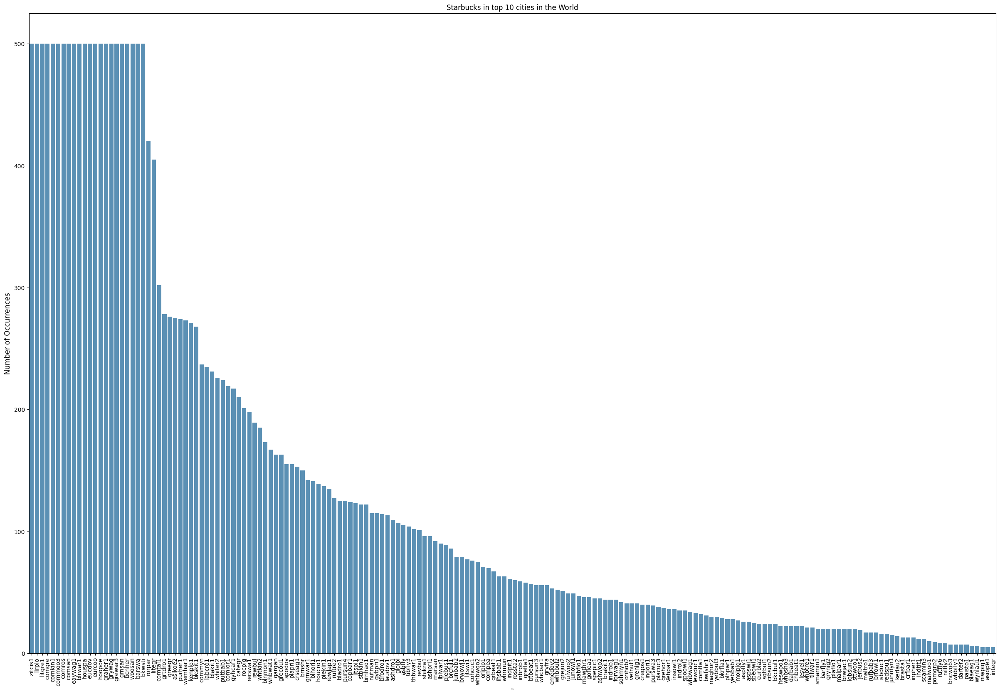

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(30,20))
sns.barplot(label_count, alpha=0.8)
plt.title('Starbucks in top 10 cities in the World')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('city', fontsize=3)
plt.xticks(rotation=90)
plt.show()

## Unlabeled Soundscapes


In [26]:
class CFG:
    # Debugging
    debug = False
    
    # Verbosity level
    verbose = 1
    
    # Plot training history
    training_plot = True
    
    # Weights and Biases logging
    wandb = True
    competition   = 'birdclef-2023' 
    _wandb_kernel = 'awsaf49'
    
    # Experiment name and comment
    exp_name = 'birdclef-pretrain-v3'
    comment = 'EfficientNetB1|No-FSR|t=10s|128x384|cutmix'
    # Notebook link
    
    # Device and random seed
    device = 'TPU-VM'
    seed = 42
    

    # Input image size and batch size
    img_size = [128, 384]
    batch_size = 32
    upsample_thr = 50 # min sample of each class (upsample)
    cv_filter = True # always keeps low sample data in train
    
    # Audio duration, sample rate, and length
    duration = 10 # second
    sample_rate = 32000
    audio_len = duration*sample_rate
    
    # STFT parameters
    nfft = 2028
    window = 2048
    hop_length = audio_len // (img_size[1] - 1)
    fmin = 20
    fmax = 16000
    normalize = True
    
    # Inference batch size, test time augmentation, and drop remainder
    infer_bs = 2
    tta = 1
    drop_remainder = True
    
    # Number of epochs, model name, and number of folds
    epochs = 25
    model_name = 'EfficientNetB1'
    fsr = False # reduce stride of stem block
    num_fold = 5
    
    # Selected folds for training and evaluation
    selected_folds = [0]

    # Pretraining, neck features, and final activation function
    pretrain = 'imagenet'
    neck_features = 0
    final_act = 'softmax'
    
    # Learning rate, optimizer, and scheduler
    lr = 1e-3
    scheduler = 'cos'
    optimizer = 'Adam' # AdamW, Adam
    
    # Loss function and label smoothing
    loss = 'CCE' # BCE, CCE
    label_smoothing = 0.05 # label smoothing
    
    # Data augmentation parameters
    augment=True
    
    # Time Freq masking
    freq_mask_prob=0.50
    num_freq_masks=1
    freq_mask_param=10
    time_mask_prob=0.50
    num_time_masks=2
    time_mask_param=25

    # Audio Augmentation Settings
    audio_augment_prob = 0.5
    
    mixup_prob = 0.65
    mixup_alpha = 0.5
    
    cutmix_prob = 0.65
    cutmix_alpha = 2.5
    
    timeshift_prob = 0.0
    
    gn_prob = 0.35


   
    # Training Settings
    target_col = ['target']
    tab_cols = ['filename']
    monitor = 'auc'

In [45]:
def load_audio(filepath):
    audio, sr = librosa.load(filepath)
    return audio, sr

def get_spectrogram(audio):
    spec = librosa.feature.melspectrogram(y=audio, 
                                   sr=CFG.sample_rate, 
                                   n_mels=CFG.img_size[0],
                                   n_fft=CFG.nfft,
                                   hop_length=CFG.hop_length,
                                   fmax=CFG.fmax,
                                   fmin=CFG.fmin,
                                   )
    spec = librosa.power_to_db(spec, ref=1.0)
    return spec

def display_audio(row):
    # Caption for viz
    # Read audio file
    audio, sr = load_audio(row)
    # Keep fixed length audio
    audio = audio[:CFG.audio_len]
    # Spectrogram from audio
    spec = get_spectrogram(audio)
    # Display audio
    print("# Audio:")
    display(ipd.Audio(audio, rate=CFG.sample_rate))
#     print("# Image:")
#     show_image(row.common_name)
    print('# Visualization:')
    fig, ax = plt.subplots(2, 1, figsize=(12, 2*3), sharex=True, tight_layout=True)
    plt.title(f'{row}')
    # Waveplot
    lid.waveshow(audio,
                 sr=CFG.sample_rate,
                 ax=ax[0],
                color= cmap(0.1))
    # Specplot
    lid.specshow(spec, 
                 sr = CFG.sample_rate, 
                 hop_length = CFG.hop_length,
                 n_fft=CFG.nfft,
                 fmin=CFG.fmin,
                 fmax=CFG.fmax,
                 x_axis = 'time', 
                 y_axis = 'mel',
                 cmap = 'coolwarm',
                 ax=ax[1])
    ax[0].set_xlabel('');
    fig.show()



# Audio:


# Visualization:


/tmp/ipykernel_244514/380782040.py:50: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


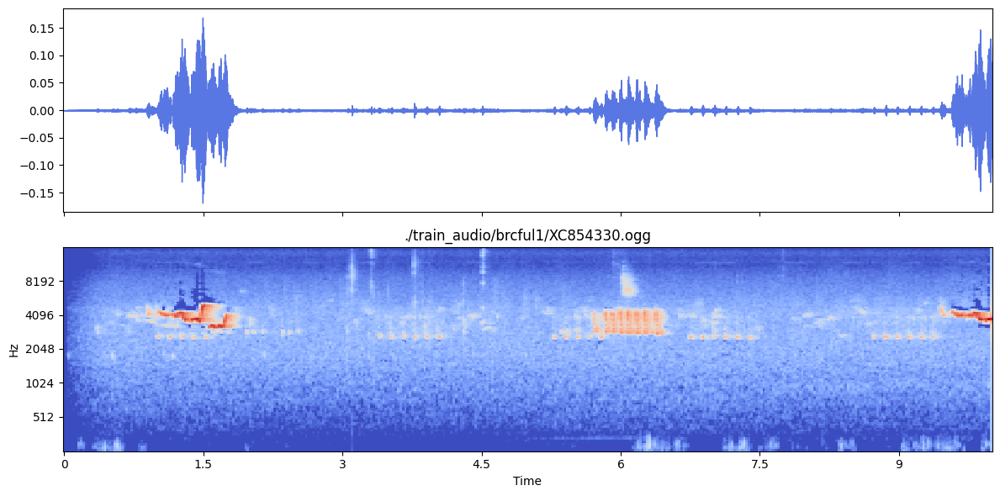

In [46]:
df1 = pd.DataFrame()
a= []

for dirname, _, filenames in os.walk('./train_audio'):
    for filename in filenames:
        a.append(os.path.join(dirname, filename))

df1['path']=a

# Display audio
display_audio(df1.path[8])

# Audio:


# Visualization:


/tmp/ipykernel_244514/2049321544.py:49: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


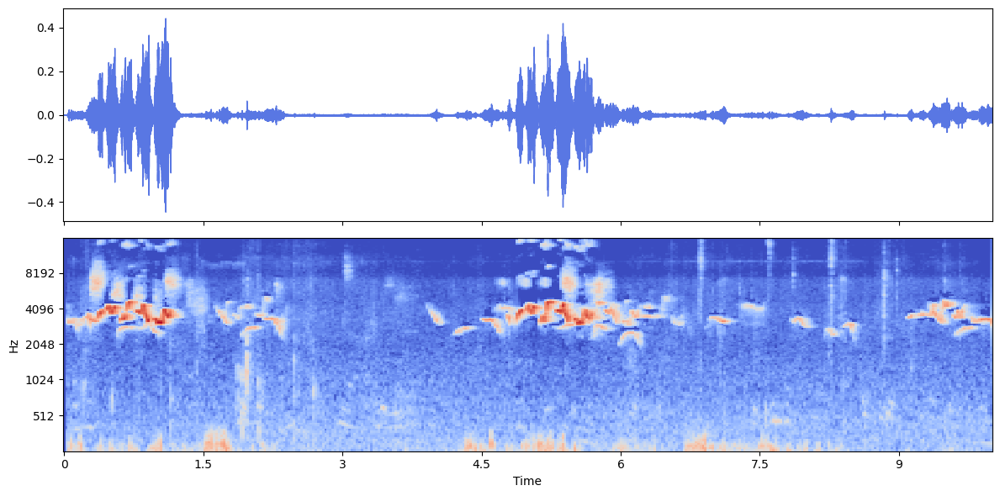

In [29]:
display_audio(df1.path[1])

# Audio:


# Visualization:


/tmp/ipykernel_244514/2049321544.py:49: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


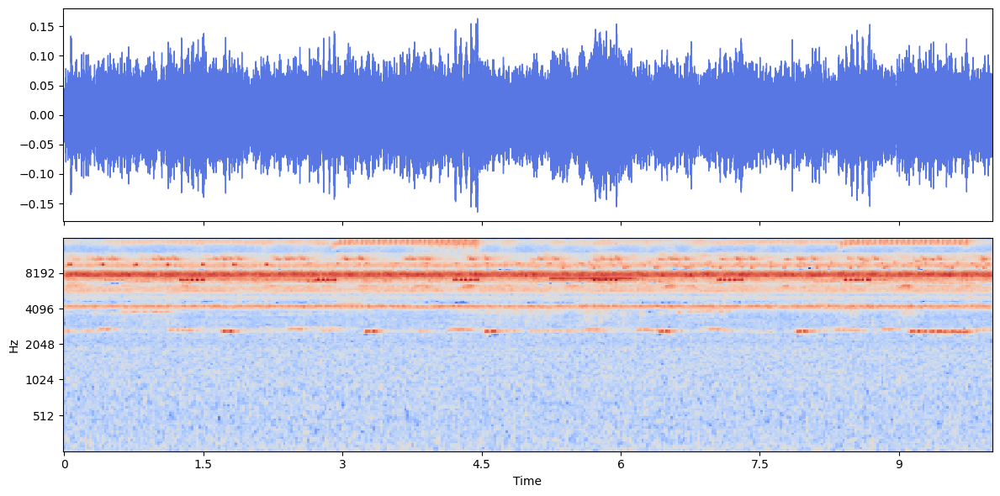

In [30]:
df_un = pd.DataFrame()
a= []

for dirname, _, filenames in os.walk('./unlabeled_soundscapes'):
    for filename in filenames:
        a.append(os.path.join(dirname, filename))

df_un['path']=a

# Display audio
display_audio(df_un.path[1])

# Audio:


# Visualization:


/tmp/ipykernel_244514/2049321544.py:49: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


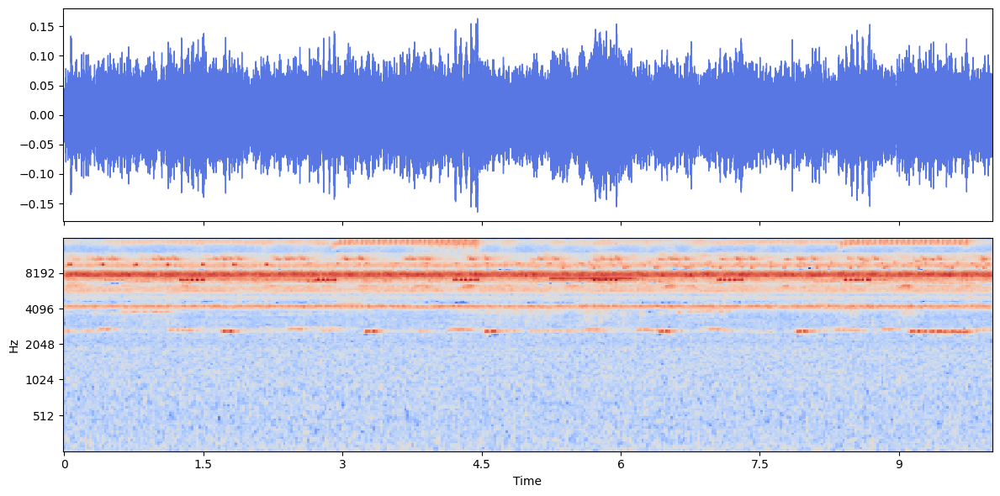

In [31]:
display_audio(df_un.path[1])

# Audio:


# Visualization:


/tmp/ipykernel_244514/2049321544.py:49: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


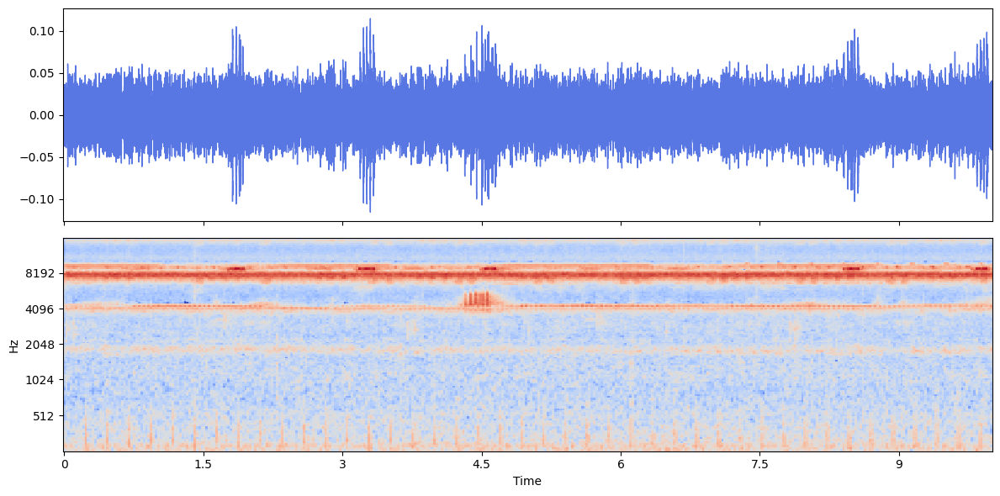

In [32]:
display_audio(df_un.path[2])

# Audio:


# Visualization:


/tmp/ipykernel_244514/2049321544.py:49: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


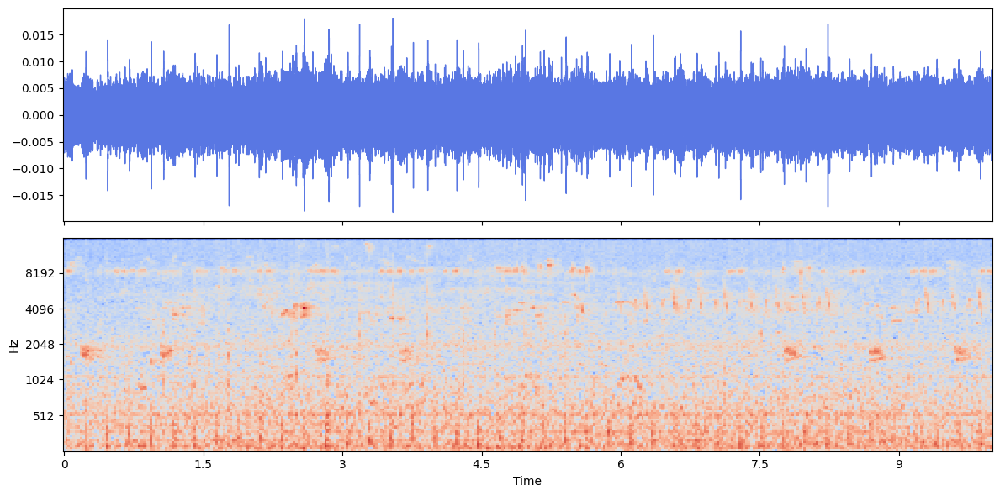

In [33]:
display_audio(df_un.path[3])

# Audio:


# Visualization:


/tmp/ipykernel_244514/2049321544.py:49: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


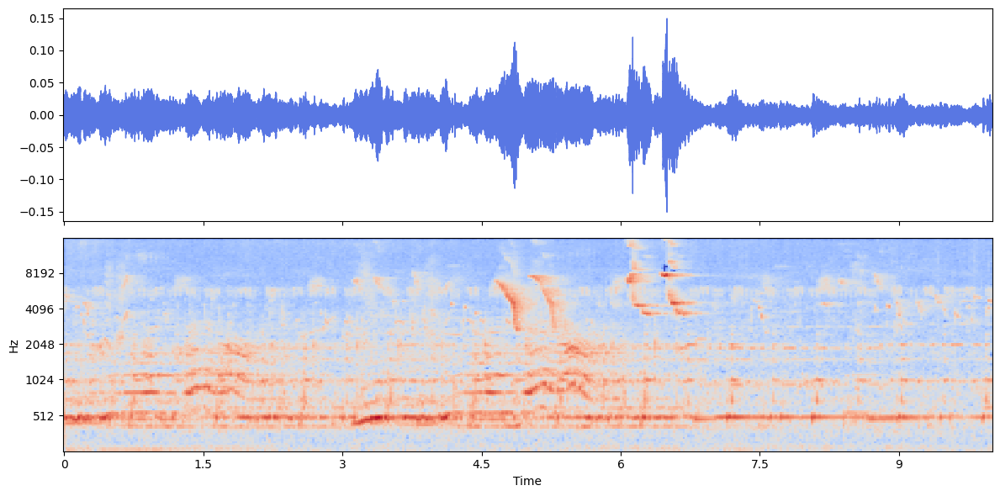

In [34]:
display_audio(df_un.path[4])

# Audio:


# Visualization:


/tmp/ipykernel_244514/2049321544.py:49: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


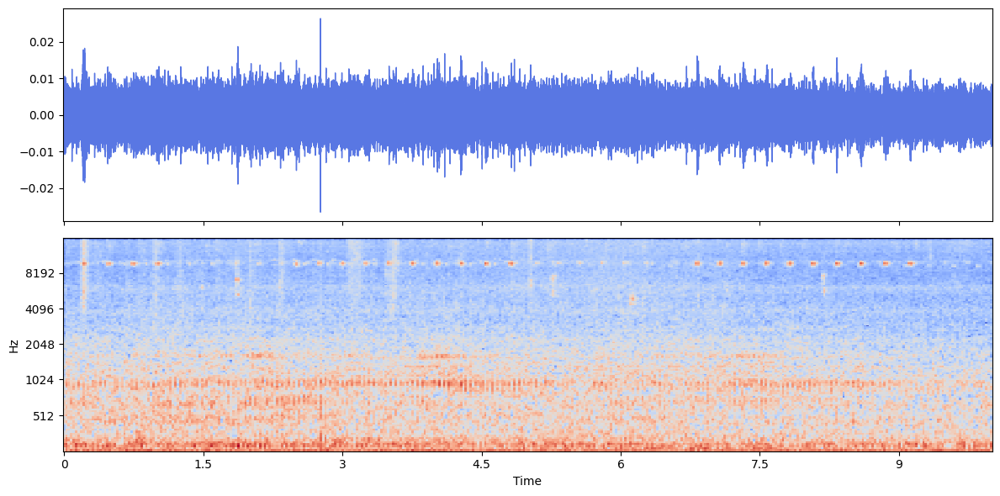

In [35]:
display_audio(df_un.path[5])

# Audio:


# Visualization:


/tmp/ipykernel_244514/2049321544.py:49: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


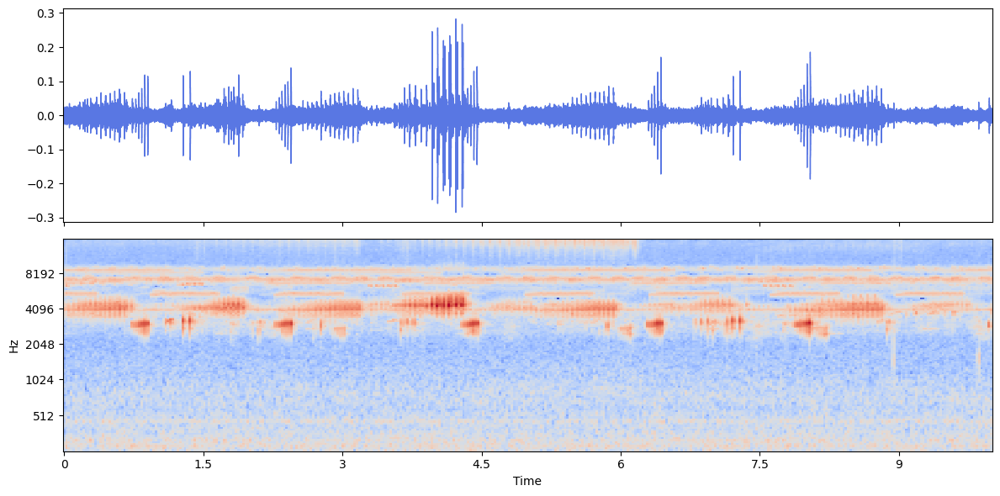

In [36]:
display_audio(df_un.path[6])